# Segmenting bank customers (with PCA)

Nuno António - Rev. 1.00 - January, 2020

### Group D.A.T.A:

**Filipe Pinho (M20190935)**;\
 **Francisco Neves (M20190089)**;\
 **Madalena Gomes (R2016699)**;\
 **Sofia Cunha (M20190795)**

### Dataset description

#### bank client data:
- **age**: numeric - age of the customer
- **job**: type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')
- **marital**: marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)
- **education**: (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')
- **default**: has credit in default? (categorical: 'no','yes','unknown')
- **housing**: has housing loan? (categorical: 'no','yes','unknown')
- **loan**: has personal loan? (categorical: 'no','yes','unknown')

#### related with the last contact of the current campaign:
- **contact**: contact communication type (categorical: 'cellular','telephone') 
- **month**: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')
- **day_of_week**: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')
- **duration**: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.

#### other attributes:
- **campaign**: number of contacts performed during this campaign and for this client (numeric, includes last contact)
- **pdays**: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
- **previous**: number of contacts performed before this campaign and for this client (numeric)
- **poutcome**: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')

#### social and economic context attributes
- **emp.var.rate**: employment variation rate - quarterly indicator (numeric)
- **cons.price.idx**: consumer price index - monthly indicator (numeric) 
- **cons.conf.idx**: consumer confidence index - monthly indicator (numeric) 
- **euribor3m**: euribor 3 month rate - daily indicator (numeric)
- **nr.employed**: number of employees - quarterly indicator (numeric)

#### subscrition info
- **y**: has the client subscribed a term deposit? (binary: 'yes','no')



More information on the dataset available at https://archive.ics.uci.edu/ml/datasets/Bank+Marketing

Customers' demographic, psycographic, and behaviral characteristics are important to describe customers. However, in this dataset some variables, such as the ones identified under **social and economic context attributes**, are generic variables. These variables explain the context at the time of data extraction and not particular characteristics of each customer. Therefore, these variables should not be considered for modeling.<br>
Other variables, such as **campaign** or **pdays**, are related to the contact of the specific campaign. Therefore, do not add value to customer knowledge. For that reason, these variables should not be considered as well.

### Initial setup and modules/packages loading

In [2]:
import os
import csv
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import category_encoders as ce
import collections
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

### Data understanding

In [3]:
# Load data 
ds = pd.read_csv('bank-additional-full.csv', sep=";")
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
age               41188 non-null int64
job               41188 non-null object
marital           41188 non-null object
education         41188 non-null object
default           41188 non-null object
housing           41188 non-null object
loan              41188 non-null object
contact           41188 non-null object
month             41188 non-null object
day_of_week       41188 non-null object
duration          41188 non-null int64
campaign          41188 non-null int64
pdays             41188 non-null int64
previous          41188 non-null int64
poutcome          41188 non-null object
emp.var.rate      41188 non-null float64
cons.price.idx    41188 non-null float64
cons.conf.idx     41188 non-null float64
euribor3m         41188 non-null float64
nr.employed       41188 non-null float64
y                 41188 non-null object
dtypes: float64(5), int64(5), object(11)
memory usa

In [4]:
# Display top 15 rows
ds.head(15)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
5,45,services,married,basic.9y,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
6,59,admin.,married,professional.course,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
7,41,blue-collar,married,unknown,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
8,24,technician,single,professional.course,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
9,25,services,single,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [5]:
# Summary statistics for all variables
#Visualização das variaveis
summary=ds.describe(include='all')
#include, porque python nao inclue todos, entao temos de alterar isto
summary=summary.transpose()
summary.head(len(summary))
#conseguimos ver que ha binary columns

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
age,41188,NaN,NaN,NaN,40.0241,10.4212,17,32,38,47,98
job,41188,12,admin.,10422,NaN,NaN,NaN,NaN,NaN,NaN,NaN
marital,41188,4,married,24928,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education,41188,8,university.degree,12168,NaN,NaN,NaN,NaN,NaN,NaN,NaN
default,41188,3,no,32588,NaN,NaN,NaN,NaN,NaN,NaN,NaN
housing,41188,3,yes,21576,NaN,NaN,NaN,NaN,NaN,NaN,NaN
loan,41188,3,no,33950,NaN,NaN,NaN,NaN,NaN,NaN,NaN
contact,41188,2,cellular,26144,NaN,NaN,NaN,NaN,NaN,NaN,NaN
month,41188,10,may,13769,NaN,NaN,NaN,NaN,NaN,NaN,NaN
day_of_week,41188,5,thu,8623,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
# Check missing values
#describe to analyse the missing values
#como ha binary columns, podem nao ser missing values
print(ds.isnull().sum())

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64


Summary statistics shows:
- There are no missing values (in the sense of having no empty columns). But, some binary columns wih yes and no categories, show that there are a third category, so missing values could be in that third category (e.g., **default**, **housing**, etc.).
- **Job** has 12 categories. This can indicate issues in distribution, such as some categories win many observations and others with only a few observations. **Marital** and **Education** also have a high number of categories. 

In [6]:
# Check counts of categorical variables
cols = ['default', 'housing', 'loan', 'poutcome' , 'y']
ds[cols].apply(pd.Series.value_counts)

,default,housing,loan,poutcome,y
failure,NaN,NaN,NaN,4252.0,NaN
no,32588.0,18622.0,33950.0,NaN,36548.0
nonexistent,NaN,NaN,NaN,35563.0,NaN
success,NaN,NaN,NaN,1373.0,NaN
unknown,8597.0,990.0,990.0,NaN,NaN
yes,3.0,21576.0,6248.0,NaN,4640.0


The above table shows that some categorical variables are not well balanced (e.g., **poutcome** or **y**), and that others, such as **default** have a high number of "unkowns" (missing values). These problems should be a considered in the decision to include or remove the variables from the modeling dataset.

In [8]:
# Exploration of categorical variables: cross table of job and education
table1 = pd.crosstab(index=ds['job'], columns=ds['education'])
table1

education,basic.4y,basic.6y,basic.9y,high.school,illiterate,professional.course,university.degree,unknown
job,,,,,,,,
admin.,77,151,499,3329,1,363,5753,249
blue-collar,2318,1426,3623,878,8,453,94,454
entrepreneur,137,71,210,234,2,135,610,57
housemaid,474,77,94,174,1,59,139,42
management,100,85,166,298,0,89,2063,123
retired,597,75,145,276,3,241,285,98
self-employed,93,25,220,118,3,168,765,29
services,132,226,388,2682,0,218,173,150
student,26,13,99,357,0,43,170,167


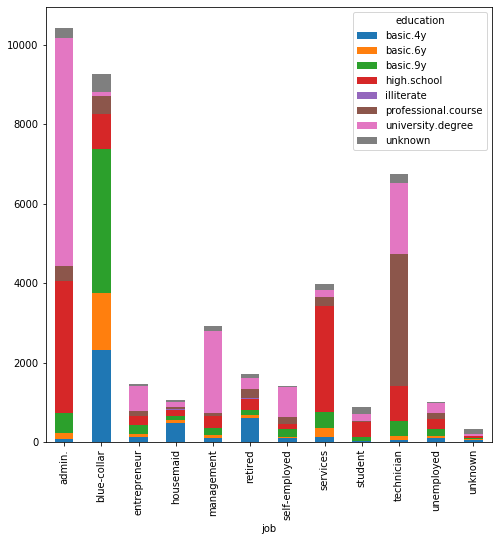

In [9]:
# Visual exploration of the cross table
table1.plot(kind="bar", 
                 figsize=(8,8),
                 stacked=True)

As summary statistics shown, job has 12 categories, but some have few observations. Grouping these categories into less categories should be considered (e.g., one category for professinal.course and basic levels, one for high-school, one for university, and other).

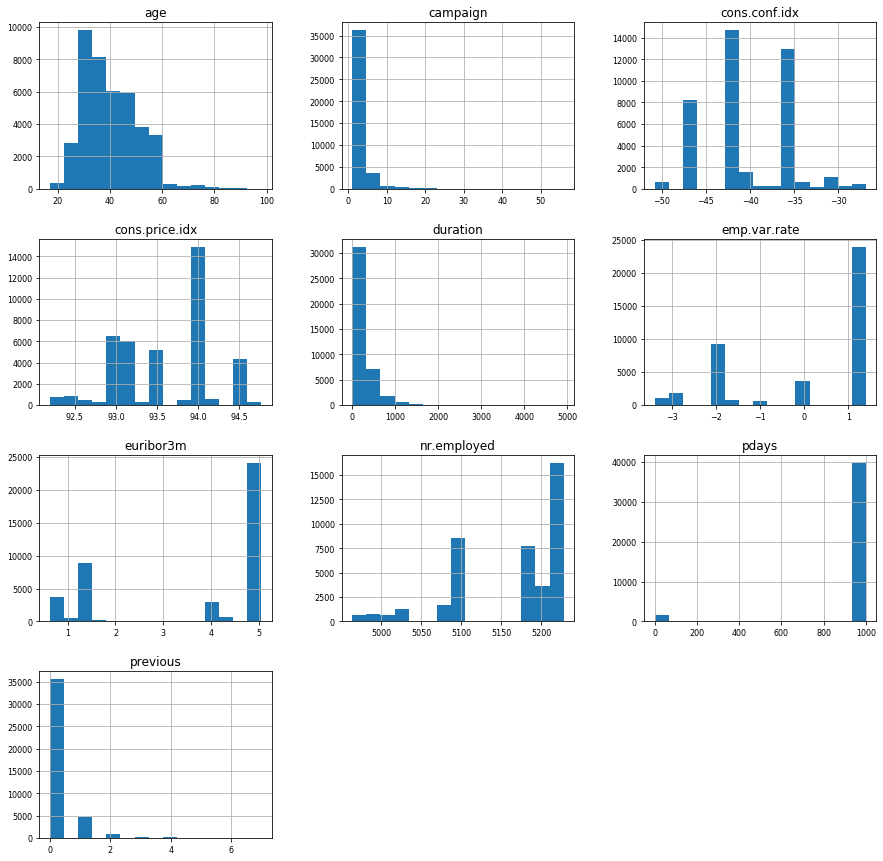

In [10]:
# Do histograms on all numeric variables
#como forma de melhor analisar as variaveis e os customers
#age é a unica com ums consistencia na analise
numerical=ds.select_dtypes(include=[np.number]).columns.tolist()
ds[numerical].hist(bins=15, figsize=(15, 15), layout=(4, 3), xlabelsize=8, ylabelsize=8);

Apart from **Age** which has a sort of normal distribution, all other features have uncommon distributions. Since all the other numeric varibales should not be used, no transformations should be needed to be done.

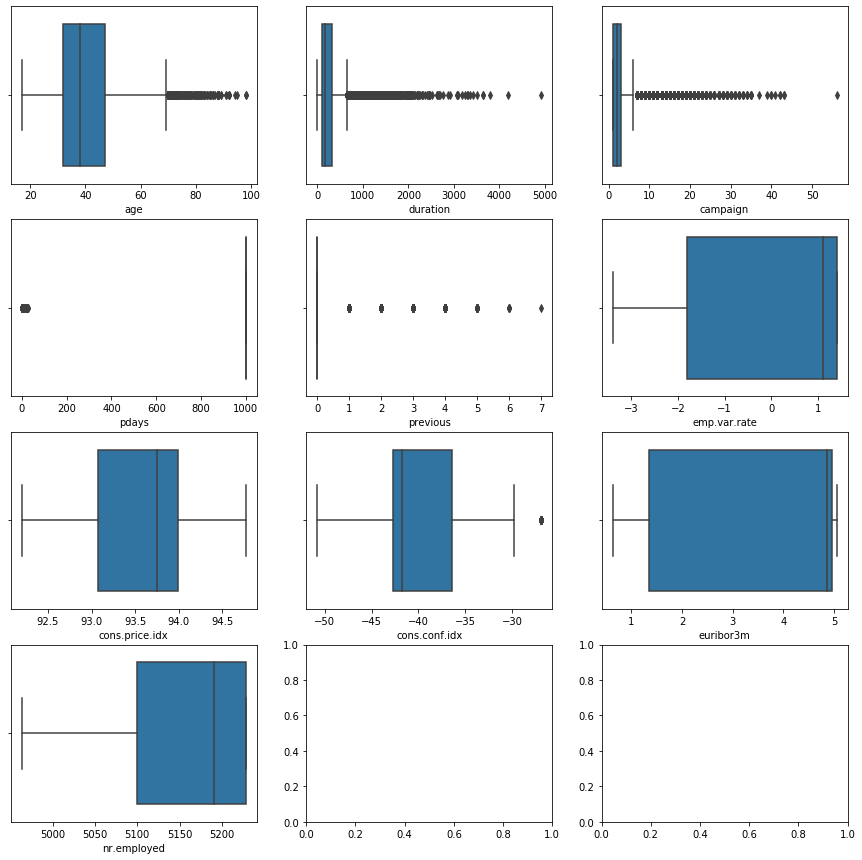

In [11]:
# Do boxplots on all numeric variables
fig, ax = plt.subplots(4, 3, figsize=(15, 15))
for var, subplot in zip(ds[numerical], ax.flatten()):
    sns.boxplot(ds[var], ax=subplot)
#analisar os outliers para ver se ha necessiade de se fazer transformações aos dados e as variaveis

**Age** seems to have some outliers. A transformation should be applied to this variable to soften this problem.

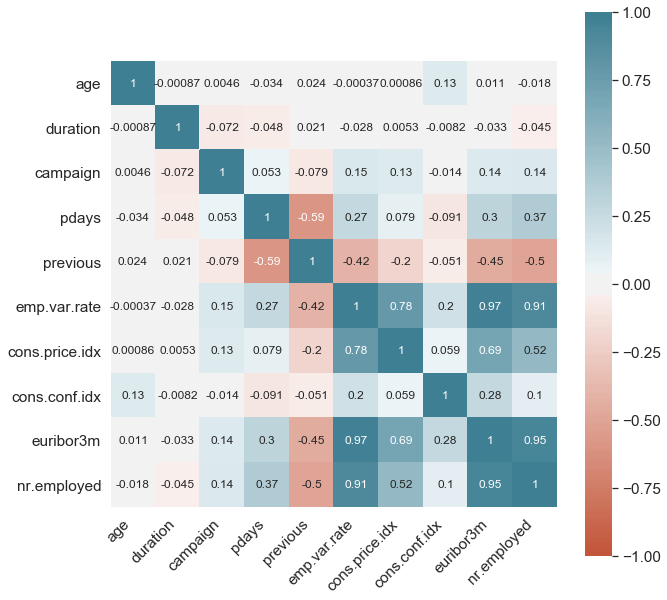

In [12]:
# Plot correlation heatmap of all numeric variables
corr = ds[numerical].corr()
plt.figure(figsize=(10, 10))
sns.set(font_scale=1.4)
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True, annot_kws={"size": 12}
)
bottom, top = ax.get_ylim() # These two lines were added due to bug on current Seaborn version
ax.set_ylim(bottom + 0.5, top - 0.5) #
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);
#numeric correlation para ver se as variaveis podem ser "redonded"

Usually, highly correletad variables should be removed from the model. In this case, there are indeed some highly correlated variables, but mostly are the variables related to the strategic context (e.g., **emp.var.rate** and **nr.employed**) or to the campaing itself (**pdays** and **previous**).

### Data preparation

In [26]:
# Create a modeling dataset from the original dataset
X = ds.copy(deep=True)
#as trasnformaçoes foram feitas, mas no entanto não se substituiram no original, apenas se cria uma nova para fazer

In [27]:
# Bin the age
#transformar age em intervalos
X['age_bins'] = pd.cut(x=X['age'], bins=[0, 19, 29, 39, 49, 59, 99], labels=['<20','20-29','30-39','40-49','50-59','>=60'])

# Drop the age column
X.drop(columns='age', inplace=True)

In [28]:
# Remove columns that should not be used as they do not represent customer's characteristics or behavior
cols = ['contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays', 'previous', 'emp.var.rate',
 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']
X.drop(columns=cols, inplace=True)

In [29]:
# Encode target to 0 (no) and 1 (yes)
X['y'] = X['y'].map({'yes': 1, 'no': 0})
#juntar os clientes pelos savings(poupanças) que têm ou nao dinheiro

In [30]:
# Encode categorical variables to dummy variables
cols = ['default', 'housing', 'loan', 'poutcome', 'age_bins' ]
ce_one_hot = ce.OneHotEncoder(cols = cols, use_cat_names=True)
X = ce_one_hot.fit_transform(X)
#encode de forma a ser possivel usar kmeans, pelo o que se faz é criar 3 colunas diferentes, de forma a que a analise seja numerica

In [31]:
# Encode multi-categorical variables to dummy variables (to avoid high cardinality and strange distributions)

# Function to return categories of columns based on threshold of distribution of the category
def one_hot(s, threshold,prefix):
    d = pd.get_dummies(s)
    f = pd.value_counts(s, sort=False, normalize=True) < threshold
    if f.sum() == 0:
        newSeries=d
    else:
        newSeries=d.loc[:, ~f].join(d.loc[:, f].sum(1).rename('Other'))
    newSeries=newSeries.add_prefix(prefix)
    return newSeries

# One hot encoding of all categories above 15% - all others categories to "Other"
cols = ['job', 'marital', 'education']
for i in range(len(cols)):
    colToProcess = X[cols[i]].astype(str)
    procDF = one_hot(colToProcess, .15,cols[i]+'_')
    X.drop(columns=cols[i], inplace=True)
    X = pd.concat([X, procDF], axis=1)

In [ ]:
X.head()

In [32]:
#para usar o kmeans é necessario normalizar os dados
# Get a copy of the dataframe before normalization (para analistas ter os dados desnormalizados é importante)
X_beforeNorm = X.copy(deep=True)

# Normalize all columns
cols = list(X.columns) # save the name of the columns
X_array = X.values # returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
X_scaled = min_max_scaler.fit_transform(X_array) #x depois da normalização
X = pd.DataFrame(X_scaled, columns=cols)

#### Analyze Principal Components

(41188, 2)


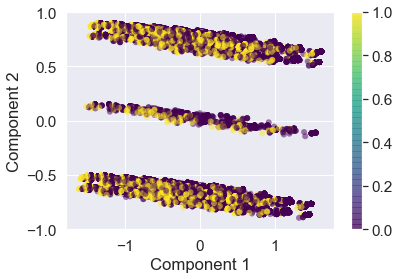

In [33]:
# Let'start to visualizar with only two components
pca2 = PCA(n_components = 2)
pca2.fit(X)
X_pca2 = pca2.transform(X) # Apply the dimension reduction to the dataset
print(X_pca2.shape)

# Plot a scatter plot of the two Principal Components by the "target" to see if there is any pattern
plt.scatter(X_pca2[:, 0], X_pca2[:, 1], c=X.y, edgecolor='none', alpha=0.5, cmap='viridis')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.colorbar();

#a 1a coisa que queremos ver é se ha clusters, se ha alguma separação (neste caso nao ha separações)

Two main components visualization shows that indeed there seems to exist three or six clusters. Three horizontal clusters, with some other separated clusters at the right.

In [34]:
# Fit the PCA algorithm to data 
pca = PCA().fit(X)

# Show the variance per component
pcaevr = ['{:f}'.format(item) for item in pca.explained_variance_ratio_]
pcaDF = pd.DataFrame({'Component': range(1, len(X.columns)+1),
                      'Variance explained': pcaevr,
                      'Cumulative variance explained': np.cumsum(pca.explained_variance_ratio_)})
pcaDF

#componentes da pca so exoliocam 36%, entao para usar e nao perder variance devemos fazer com 20 components apenas

,Component,Variance explained,Cumulative variance explained
0,1,0.146522,0.146522
1,2,0.118040,0.264562
2,3,0.094042,0.358604
3,4,0.082169,0.440773
4,5,0.074665,0.515438
5,6,0.069559,0.584997
6,7,0.063782,0.648779
7,8,0.061127,0.709906
8,9,0.048925,0.758831
9,10,0.046672,0.805502


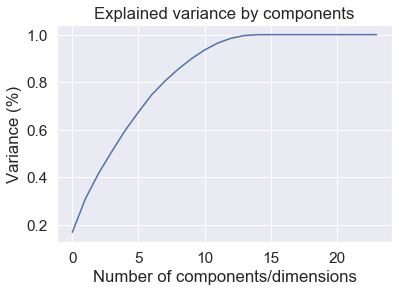

In [23]:
# Plot the cumulative explained variance
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of components/dimensions')
plt.ylabel('Variance (%)')
plt.title('Explained variance by components')
plt.show()

With 15 components is possible to explain 96.5% of the variance.

### Modeling - K-Means - 15 Components

In [35]:
# Apply the dimension reduction to the dataset (for 15 components) (explica 96,5%)
#usar um numero consideravel oara fazer uma boa analise, mas nao too much para nao ser lento
pca_reduced = PCA(n_components = 15)
pca_reduced.fit(X)
X_pca_reduced = pca_reduced.transform(X) 
print(X_pca_reduced.shape)

(41188, 15)


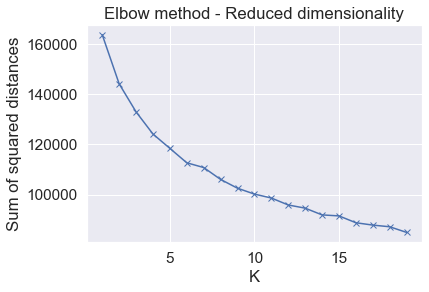

In [36]:
# Select K based on the sum of squared distances
ssd = []
K = range(1,20)
for k in K:
    km = KMeans(n_clusters=k, random_state=123)
    km = km.fit(X_pca_reduced)
    ssd.append(km.inertia_)
    
# Plot results
plt.plot(K, ssd, 'bx-')
plt.xlabel('K')
plt.ylabel('Sum of squared distances')
plt.title('Elbow method - Reduced dimensionality')
plt.show()

K=6 seems to be the choice using this method

In [37]:
# Apply the K-Means for K=6
K=6
kmeans = KMeans(n_clusters=K, random_state=123)
kmeans.fit(X_pca_reduced)
y_kmeans = kmeans.predict(X_pca_reduced)
#NAO ESQUECER O RANDOM_STATE (para que os resultados sejam sempre os mesmo em cada vez que corremos o codigo)
#experimentar com varios valores, e varias tecnicas, de forma a criar uma melhor analise
#muitos grupos dificultam a analise e as estrategias, fica dificil de gerir tantas campanhas de marketing e de vendas
#simplicidade e obejetividade reinam!!

In [38]:
# Count observations per cluster
X_beforeNorm.groupby(y_kmeans).size()
#6 clusters,e o numero de clientes em cada cluster,e mostra que a divisoria é favoravel,uma vez que têm numeros semelhantes

0    6381
1    7587
2    8807
3    7006
4    4829
5    6578
dtype: int64

Results seems to be even distributed among clusters.

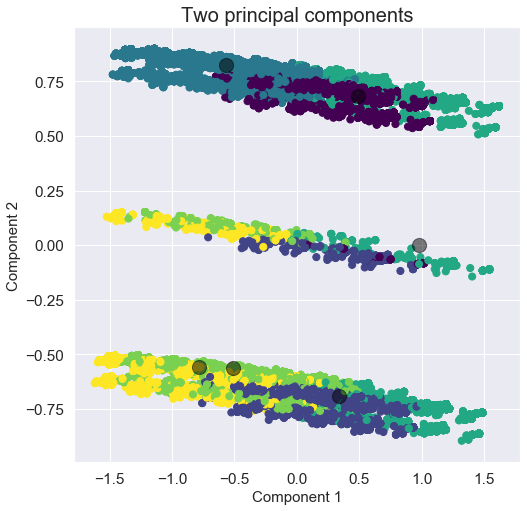

In [39]:
# Plot results two principal components
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Component 1', fontsize = 15)
ax.set_ylabel('Component 2', fontsize = 15)
ax.set_title('Two principal components', fontsize = 20)
ax.scatter(X_pca_reduced[:, 0], X_pca_reduced[:, 1], c=y_kmeans, s=50, cmap='viridis')

centers = kmeans.cluster_centers_
ax.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5)

#mostra que os clusters estao proximo, mas em 2D a analise nao é enough para ver a localização

Although there is a separation of customers by clusters, in a 2D visualization, partitions are not well delimited.

In [40]:
# Create a dataframe with the weights per component
wheightsDF = pd.DataFrame(pca.components_,columns=X.columns)
wheightsDF

,default_no,default_unknown,default_yes,housing_no,housing_yes,housing_unknown,loan_no,loan_yes,loan_unknown,poutcome_nonexistent,...,job_admin.,job_blue-collar,job_technician,job_Other,marital_married,marital_single,marital_Other,education_high.school,education_university.degree,education_Other
0,-0.263703,2.636227e-01,8.082138e-05,0.065276,-0.066780,0.001504,0.011995,-0.013499,0.001504,0.052917,...,-0.281940,0.285499,-0.000656,-0.002903,0.356974,-0.328934,-0.028040,-0.146866,-0.332990,0.479856
1,0.014083,-1.411862e-02,3.569667e-05,0.701199,-0.702042,0.000843,0.047450,-0.048293,0.000843,0.014771,...,0.028594,-0.027613,-0.011615,0.010634,-0.029543,0.024236,0.005307,0.032374,0.030894,-0.063269
2,0.052819,-5.278139e-02,-3.774934e-05,0.015163,-0.015901,0.000737,0.004060,-0.004798,0.000737,-0.001844,...,-0.063562,0.311711,0.166722,-0.414871,-0.390427,0.385467,0.004960,-0.176385,-0.226200,0.402586
3,-0.132356,1.323615e-01,-5.654380e-06,-0.004906,0.003325,0.001581,0.018801,-0.020382,0.001581,-0.034197,...,-0.230255,-0.076117,-0.070939,0.377310,-0.455762,0.344545,0.111217,0.162021,-0.209130,0.047109
4,-0.391866,3.918668e-01,-4.113527e-07,-0.006077,0.003884,0.002193,-0.044648,0.042455,0.002193,0.122544,...,0.427100,0.084817,-0.036818,-0.475099,-0.111010,0.083499,0.027510,-0.063100,0.226979,-0.163879
5,-0.464569,4.645715e-01,-2.126449e-06,-0.014870,0.012220,0.002649,-0.006017,0.003368,0.002649,0.094042,...,-0.121231,-0.045790,-0.090523,0.257544,-0.051582,0.096447,-0.044865,0.158772,-0.023583,-0.135188
6,0.023484,-2.342245e-02,-6.191278e-05,0.018992,-0.078503,0.059511,-0.729411,0.669899,0.059511,-0.007502,...,-0.023813,0.005534,-0.017617,0.035896,0.001012,0.003693,-0.004705,0.012669,-0.033192,0.020523
7,0.054848,-5.490080e-02,5.276311e-05,-0.011390,0.013798,-0.002409,0.010872,-0.008463,-0.002409,-0.005823,...,0.168820,0.138195,-0.104670,-0.202345,0.096516,-0.063506,-0.033010,0.711520,-0.544242,-0.167278
8,-0.055977,5.604375e-02,-6.652797e-05,0.013067,-0.013211,0.000144,0.009925,-0.010069,0.000144,-0.493190,...,0.219783,0.122811,-0.218693,-0.123901,0.088106,-0.019814,-0.068292,0.000593,-0.024920,0.024327
9,-0.120039,1.198677e-01,1.717583e-04,0.005993,-0.008904,0.002911,-0.006521,0.003610,0.002911,-0.511061,...,-0.094388,0.039485,-0.046586,0.101489,-0.014007,0.045310,-0.031303,-0.072407,0.094281,-0.021874


In [41]:
# Study the weights of component 15
comp = abs(wheightsDF.iloc[14])  ## id 14 is component 14
comp = comp.sort_values(ascending=False)
comp

age_bins_20-29                 0.555727
y                              0.508653
age_bins_50-59                 0.364155
marital_single                 0.319757
marital_Other                  0.310479
age_bins_40-49                 0.184295
poutcome_failure               0.129981
poutcome_success               0.121932
job_blue-collar                0.119980
education_high.school          0.081874
job_admin.                     0.072328
education_Other                0.064399
default_no                     0.037842
default_unknown                0.037768
job_Other                      0.029656
job_technician                 0.017996
education_university.degree    0.017475
age_bins_30-39                 0.013768
age_bins_>=60                  0.013675
marital_married                0.009277
poutcome_nonexistent           0.008049
age_bins_<20                   0.007184
housing_no                     0.003713
loan_yes                       0.003356
loan_unknown                   0.002016


In [43]:
# Check the mean values of each cluster for top 30 relevant featureslen()
top_features = comp[:30].index
clustersMeanDF = pd.DataFrame(X_beforeNorm[top_features].groupby(y_kmeans).mean(),columns=top_features)
clustersMeanDF.transpose()

#plot the x before normalization,and after the normalized
#é possivel ver que no cluster 0 é explicado 12% da amostra
#isto quer dizer que é possivel analisar as patterns e a importancia e montante de clientes por cluster

,0,1,2,3,4,5
age_bins_20-29,0.126783,0.129959,0.171795,0.056666,0.203562,0.137732
y,0.108604,0.126400,0.132735,0.049386,0.114724,0.139708
age_bins_50-59,0.162044,0.172005,0.118088,0.289466,0.109132,0.141076
marital_single,0.218618,0.241334,0.375270,0.119754,0.354525,0.377926
marital_Other,0.113775,0.119810,0.125695,0.081073,0.132947,0.112496
age_bins_40-49,0.259520,0.255832,0.213012,0.380674,0.221371,0.200213
poutcome_failure,0.104999,0.117833,0.105371,0.054953,0.134811,0.110064
poutcome_success,0.031343,0.040728,0.040763,0.006280,0.033547,0.045455
job_blue-collar,0.396803,0.367075,0.040763,0.445475,0.085939,0.006385
education_high.school,0.000000,0.000000,0.432951,0.124607,1.000000,0.000000


#### Some insights:

**Cluster 0**: Less educated, with family, and lower income
* Less educated customers (no high-school or university degree)
* Blue-collar, technicians, and other jobs
* 98% do not own a house
* Customers above the 30 years old, being the second group with oldest Customers
* 67% are married

**Cluster 1**: Less educated, with family, with higher income
* Less educated customers (no high-school or university degree)
* Blue-collar, technicians, and other jobs
* 97% own a house
* Customers above the 30 years old, being the first group with oldest Customers
* 64% are married
* More likely to have a loan than customers of cluster 0 (probably for the house)

**Cluster 2**: Better educated, but not owning a house
* Customers from 20-59, but with almost half having 30-39 years hold
* Have an high-school diploma or a university degree
* Do not own a house
* 50% are married
* More than 40% have administrative jobs
* Second cluster more propensive to direct markeitng

**Cluster 3**: Direct marketing sceptics
* Majority of the customers above 40 years old
* Less likely to subscribe
* No record of default
* 80% are married
* Different levels of education

**Cluster 4**: Younger customers with some acquisitive power
* Majority of customers below 50 years old, with 20% having less than 30 years old
* Customers without a university degree
* 96% own a house
* No record of default
* Have administrative or other jobs
* Half are married

**Cluster 5**: Customers with high acquisitive power 
* First cluster more propensive to direct marketing
* 70% of the customers have between 30 and 49 years old
* All have a university degree
* Most likely to have an administrative or a technician job
* Half are married
* 96% own a house
* No record of default